# Домашняя работа 3: Разработка модели детектирования объектов

##  Пономаренко Алексей Сергеевич


На семинаре мы обсудили, разработали и попробовали `SSD` модель на базе `VGG16`, поэтому для успешного выполнения домашнего задания рекомендуется обратиться к семинару.

Задачи домашнего задания:
 - Загрузить набор данных и визуализировать объекты. (2 балла)
 - Разработать функцию для расчета метрики mAP задачи детектирования объектов. Продемонстрировать работу. (4 балла)
 - Натренировать `SSD` модель на базе VGG16. Продемонстрировать повышение метрики mAP (4 балла)
 - Разработать `SSD` модель согласно предлагаемой архитектуры на базе `ResNet18`. Продемонстрировать повышение метрики mAP (10 баллов)
 - (БОНУС) Добавить разнообразные аугментации изображений. Можно позаимствовать из других репозитариев с указанием источника. Повторить эксперименты (5 баллов)

In [1]:
!git clone https://github.com/SergeyMalashenko/ObjectDetectionProblemFromScratch.git utils

Cloning into 'utils'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 10 (delta 0), reused 7 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (10/10), 24.75 KiB | 24.75 MiB/s, done.


## Описание предлагаемых исходных кодов и набора данных
- voc_dataset.py     - загружает предлагаемый набор данных, здесь также возможно выполнять аугментации над данными.
- voc_dataloader.py  - формирует порцию данных.
- prior_boxes.py     - содержит все необходимые функции для работы с `prior` боксами.
    - prior_boxes - функция генерирует `prior` боксы в соотвествии с конфигурацией
    - match       - функция решает задачу сопоставления `ground truth` боксов из набора данных и `prior` боксов
    - decode      - функция вычисляет поправки между `ground truth` боксами и `prior` боксами, собственно их будет *предсказывать* наша модель
    - encode      - функция пересчитывает `prior` боксы и *предсказанные* поправки в результирующие детектирования

- multibox_loss.py - комплексная функция потерь, решается задача сопоставления *предсказанных* и `ground truth` боксов, применяется техника `hard-negative mining`, вычисляется общая функция потерь.

In [2]:
!gdown --id 14UheyBtIByVktCsOR7OF2gBsTNGAw26E
!tar -xzf dataset.tar.gz

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=14UheyBtIByVktCsOR7OF2gBsTNGAw26E
From (redirected): https://drive.google.com/uc?id=14UheyBtIByVktCsOR7OF2gBsTNGAw26E&confirm=t&uuid=1d494b3b-37be-4043-aebc-638387650c06
To: /content/dataset.tar.gz
100% 113M/113M [00:02<00:00, 46.0MB/s]


Набор данных состоит из `1528` изображений в разрешении `640x360` (тренировочная выборка - 1464 изображения, тестовая выборка - 64 изображения) в формате `VOC`.

Набор имеет следующую структуру:

|  Директория      | Содержимое |
| ---------------- | ---------- |
| Annotations      | папка содержит разметку в виде набора файлов в формате `XML`, каждый файл содержит информацию об объектах (класс объекта, рамка объекта `xmin,ymin,xmax,ymax`)    |
| ImageSets/Main   | папка содержит два текстовых файла с распределением данных на тренирововчную `trainval.txt` и тестовую выборки `test.txt` |
| JPEGImages       | папка содержит изображения в `JPEG` формате |

## Архитектура модели на основе VGG16

Обязательно посмотрите реализацию и разберитесь в том, как устроенна модель, это будет полезно при разработке собственной модели детектирования.

![Image](output_vgg16.png)

## Архитектура модели на основе ResNet18

Можно исследовать реализацию ResNet в пакете PyTorch, это будет полезно при разработке собственного детектора.

https://github.com/pytorch/vision/blob/main/torchvision/models/resnet.py

![Image](output_resnet18.png)

In [53]:
!pip install torchview

## Загружаем требуемый набор данных

In [54]:
import sys
#Добавляем директорию, чтобы была возможность импортировать необходимые модули
sys.path.insert(0, 'utils')

from multibox_loss    import *
from prior_boxes      import *
from voc_dataset      import *
from voc_dataloader   import *
# from voc_metrics      import *

In [55]:
import matplotlib.pyplot as plt
import numpy             as np
import torch
from torchvision.transforms.functional import to_pil_image
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils                 import draw_bounding_boxes

def visualize_imgs_wth_bboxes(dataloader, rows=2, cols=2, title="Visualization of Dataset"):
    """
    Визуализация изображений с bounding boxes из даталоадера.

    Параметры:
    ----------
    dataloader : torch.utils.data.DataLoader
        Даталоадер с изображениями и аннотациями.
    rows : int
        Количество строк в визуализации.
    cols : int
        Количество столбцов в визуализации.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(15 * (cols/rows) * (640/360), 15))
    axes = axes.flatten()

    img_count = 0
    max_imgs = rows * cols

    for images, box_ss, label_ss in dataloader:
        for img_idx in range(len(images)):
            if img_count >= max_imgs:
                break

            img = images[img_idx].detach().to('cpu')

            mean_tensor = torch.tensor([0.485, 0.456, 0.406]).unsqueeze(1).unsqueeze(2).expand_as(img)
            std_tensor = torch.tensor([0.229, 0.224, 0.225]).unsqueeze(1).unsqueeze(2).expand_as(img)
            img = convert_image_dtype(torch.clamp(img * std_tensor + mean_tensor, 0, 1), dtype=torch.uint8)

            boxes = box_ss[img_idx]
            _, h, w = img.shape
            boxes = boxes * torch.tensor([w-1, h-1, w-1, h-1])
            labels = [str(label.item()) for label in label_ss[img_idx]]

            img_with_boxes = draw_bounding_boxes(img, boxes=boxes, labels=labels, colors="blue", width=2)

            img_with_boxes_pil = to_pil_image(img_with_boxes)
            axes[img_count].imshow(np.asarray(img_with_boxes_pil))
            axes[img_count].set(xticks=[], yticks=[], xticklabels=[], yticklabels=[])

            img_count += 1

        if img_count >= max_imgs:
            break

    fig.suptitle(title, fontsize=20)

    plt.tight_layout()
    plt.show()

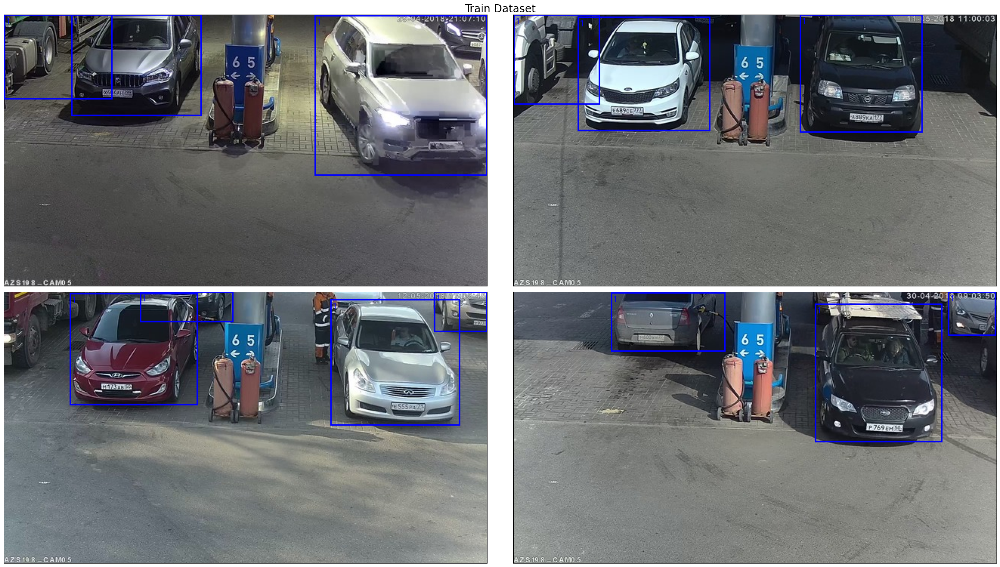

In [56]:
import os

voc_root = "dataset"

train_annotation_filename = os.path.join( voc_root, "ImageSets/Main/trainval.txt" )

train_dataloader = get_train_dataloader(voc_root, train_annotation_filename, batch_size=4, num_workers=os.cpu_count())

visualize_imgs_wth_bboxes(train_dataloader, title="Train Dataset")

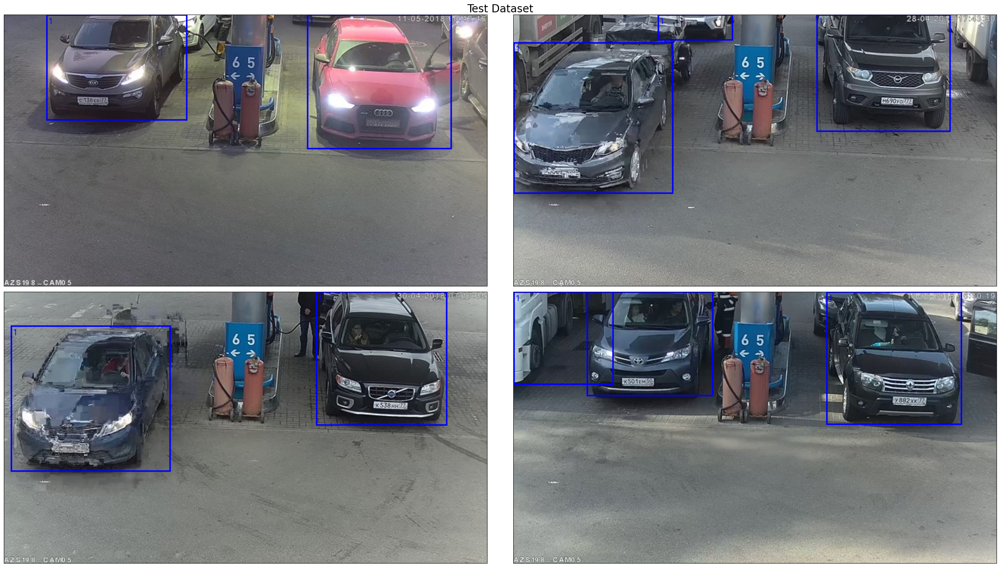

In [57]:
import os

voc_root = "dataset"

test_annotation_filename  = os.path.join( voc_root, "ImageSets/Main/test.txt" )

test_dataloader  = get_test_dataloader(voc_root, test_annotation_filename, batch_size=4, num_workers=os.cpu_count())

visualize_imgs_wth_bboxes(train_dataloader, title="Test Dataset")

## Разработать функцию вычисление mAP метрики задачи детектирования

В качестве примера можно использовать https://lightning.ai/docs/torchmetrics/stable/detection/mean_average_precision.html

In [58]:
def IoU(box, box_gt):
    """
    ---------------------------------------------------------------------
    Вычисление метрики IoU (Intersection over Union) между двумя боксами.
    ---------------------------------------------------------------------
    Параметры:
    ----------
    box : list
        Прямоугольник предсказания в формате [x_min, y_min, x_max, y_max].
    box_gt : list
        Истинный прямоугольник в формате [x_min, y_min, x_max, y_max].
    -----------
    Возвращает:
    -----------
    float
        Значение IoU (от 0 до 1) или 0, если объединение равно 0.
    """
    x_min, y_min, x_max, y_max = box
    x_min_gt, y_min_gt, x_max_gt, y_max_gt = box_gt

    x_left = max(x_min, x_min_gt)
    y_top = max(y_min, y_min_gt)
    x_right = min(x_max, x_max_gt)
    y_bottom = min(y_max, y_max_gt)

    width = max(x_right - x_left, 0)
    height = max(y_bottom - y_top, 0)
    intersection = width * height

    area_pred = (x_max - x_min) * (y_max - y_min)
    area_gt = (x_max_gt - x_min_gt) * (y_max_gt - y_min_gt)
    union = area_pred + area_gt - intersection

    return intersection / union if union > 0 else 0.0

In [59]:
import torch

def Precision_Recall(is_pred_correct_ss):
    """
    Вычисление тензоров Precision и Recall для задачи подсчёта mAP.

    Параметры:
    ----------
    is_pred_correct_ss : torch.Tensor
        Булевский тензор, где True соответствует правильному предсказанию, False - ошибочному.

    Возвращает:
    ----------
    precisions : torch.Tensor
        Тензор значений Precision для каждого предсказания.
    recalls : torch.Tensor
        Тензор значений Recall для каждого предсказания.
    """
    num_true = is_pred_correct_ss.sum().item()

    if num_true == 0:
        precisions = torch.zeros_like(is_pred_correct_ss, dtype=torch.float32)
        recalls = torch.zeros_like(is_pred_correct_ss, dtype=torch.float32)
        return precisions, recalls

    cumulative_correct = is_pred_correct_ss.cumsum(dim=0)

    indices = torch.arange(1, is_pred_correct_ss.size(0) + 1, dtype=torch.float32)

    precisions = cumulative_correct / indices

    recalls = cumulative_correct / num_true

    return precisions, recalls

In [60]:
import torch
import matplotlib.pyplot as plt

def Average_Precision(precisions, recalls, smooth=True, show=False, label=None):
    """
    ------------------------------------------------------------------
    Вычисляет площадь под кривой Precision-Recall (Average Precision).
    ------------------------------------------------------------------
    Параметры:
    ----------
    precisions : torch.Tensor
        Значения точности (precision).

    recalls : torch.Tensor
        Значения полноты (recall).

    smooth : bool, optional, по умолчанию True
        Если True, производит сглаживание Precision для монотонности.

    show : bool, optional, по умолчанию False
        Если True, отображает график Precision-Recall.

    label : str, optional
        Метка класса для отображения в заголовке графика.

    -----------
    Возвращает:
    -----------
    average_precision : float
        Площадь под кривой Precision-Recall.
    """
    precisions = torch.cat( (torch.tensor([0], dtype=precisions.dtype), precisions) )
    recalls = torch.cat( (torch.tensor([0], dtype=recalls.dtype), recalls) )

    if smooth:
        reversed_precisions = precisions.flip(0)
        for i in range(1, reversed_precisions.size(0)):
            if reversed_precisions[i] < reversed_precisions[i - 1]:
                reversed_precisions[i] = reversed_precisions[i - 1]
        smoothed_precisions = reversed_precisions.flip(0)

    diffs_x = recalls[1:] - recalls[:-1]
    precs = smoothed_precisions if smooth else precisions
    diffs_y = 0.5 * (precs[1:] + precs[:-1])
    avg_precision = torch.sum(diffs_x * diffs_y)

    if show:
        fig, ax = plt.subplots(figsize=(12, 6))

        ax.plot(recalls.numpy(), precisions.numpy(), label='Original Curve', color='orange', linewidth=2, marker='o')
        if smooth:
            ax.plot(recalls.numpy(), smoothed_precisions.numpy(), label='Smoothed Curve', color='green', linewidth=2, marker='*')

        ax.text(0.5, 0.1, f"AP = {avg_precision.item():.4f}", fontsize=14, color='blue', transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.8))

        ax.set_title(f"Precision-Recall Curve for Class {label}", fontsize=16)
        ax.set_xlabel("Recall", fontsize=14)
        ax.set_ylabel("Precision", fontsize=14)
        ax.legend(fontsize=12)
        ax.grid(True)

        plt.show()

    return avg_precision.item()

In [61]:
def Mean_Average_Precision(preds, targets, threshold, smooth=True, show=False):
    """
    ------------------------------------------------
    Функция вычисляет метрику mean Average Precision
    ------------------------------------------------
    Параметры:
    ----------
    preds : list of dicts
      - Содержит словари, в каждом из кот-х хранится предсказание модели для 1 изображения
      - Поля:
         boxes : float tensor of shape (num_boxes, 4)
           Содержит num_boxes предсказ. боксов в формате (xmin, ymin, xmax, ymax)
         scores : float tensor of shape (num_boxes)
           Содержит num_boxes скоров модели (степень уверенности модели)
         labels : integer tensor of shape (num_boxes)
           Содержит num_boxes оценок вероятностей принадлежности к классам

    targets : list of dicts
      - Содержит словари, в каждом из кот-х хранится ground_truth инфо об 1 изображении
      - Поля:
         boxes : float tensor of shape (num_boxes, 4)
           Содержит num_boxes ground_truth боксов в формате (xmin, ymin, xmax, ymax)
         labels : integer tensor of shape (num_boxes)
           Содержит num_boxes ground_truth меток

    threshold : float
      - Пороговое значение для IoU (если IoU > theshhold, то считаем предсказание верно)

    smooth : bool
      - Флаг, сглаживать ли значения precision для подсчета метрики AP

    show : bool
      - Флаг, вищуализировать ли метрику AP для каждого класса

    -----------
    Возвращает:
    -----------
    mAP : float
      - Метрика mAP для модели
    """
    diff_lbls = set()

    for pred, target in zip(preds, targets):
        labels = set(pred['labels'].tolist())
        diff_lbls.update(labels)
        labels = set(target['labels'].tolist())
        diff_lbls.update(labels)

    #print(diff_lbls)

    APs = []

    for lbl in diff_lbls:
        score_ss = []
        is_pred_correct_ss = []

        for pred, target in zip(preds, targets):
            mask_pred = pred  ['labels'] == lbl
            #print(mask_pred)
            mask_targ = target['labels'] == lbl
            #print(mask_targ)

            score_s  = pred ['scores'][mask_pred]
            #print(score_s)

            box_s    = pred  ['boxes'][mask_pred]
            box_s_gt = target['boxes'][mask_targ]
            #print(box_s_gt.size(0))

            is_pred_correct_s = torch.zeros(box_s.size(0), dtype=torch.bool)
            #print(is_pred_correct)

            for box_gt in box_s_gt:
                max_score, max_idx = -0.1, -1
                for i, box in enumerate(box_s):
                    iou = IoU(box, box_gt)
                    if iou > threshold:
                        score = score_s[i]
                        if score > max_score:
                            max_score, max_idx = score, i
                if max_idx != -1:
                    is_pred_correct_s[max_idx] = True

            #print(is_pred_correct)

            score_ss.append(score_s)
            is_pred_correct_ss.append(is_pred_correct_s)

        score_ss           = torch.cat(score_ss          , dim=0)
        #print(score_ss)
        is_pred_correct_ss = torch.cat(is_pred_correct_ss, dim=0)
        #print(is_pred_correct_ss)

        sorted_indices = torch.argsort(score_ss, descending=True)
        is_pred_correct_ss_sorted = is_pred_correct_ss[sorted_indices]

        precisions, recalls = Precision_Recall(is_pred_correct_ss_sorted) # Считает Precision и Recall без сглаживания
        #print(precisions, recalls)

        AP = Average_Precision(precisions, recalls, smooth=smooth, show=show, label=lbl) # Если show==True то строит график Recall-Precision по сглаженным (если smooth==True) P и R
        #print(f"AP {AP}")

        APs.append(AP)

    APs = torch.tensor(APs)
    #print(APs)

    mAP = torch.mean(APs, dim=0)

    return mAP.item()

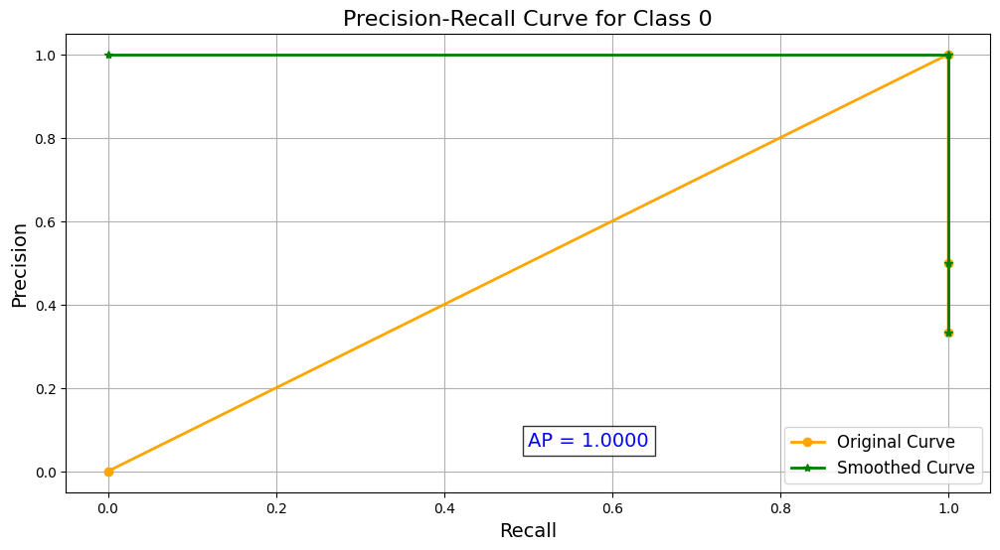

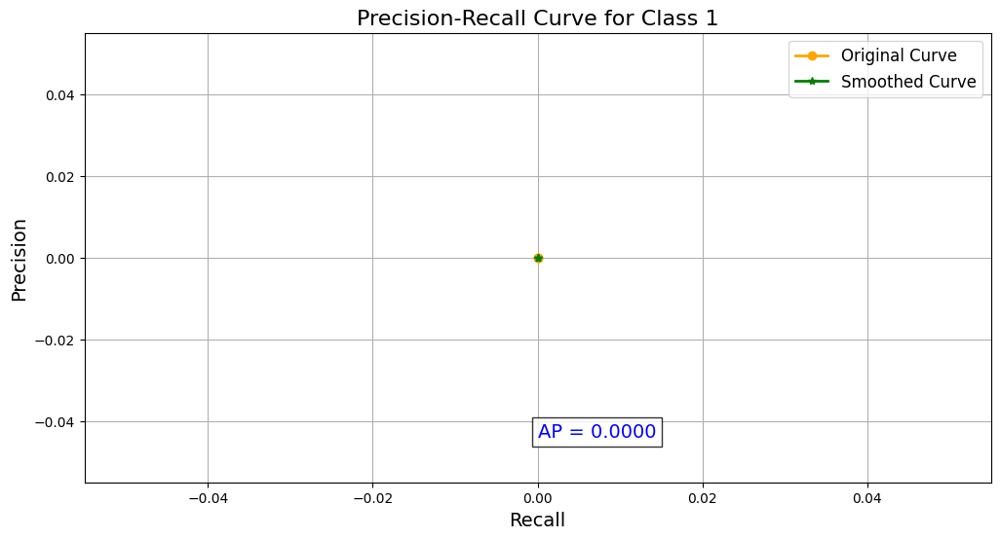

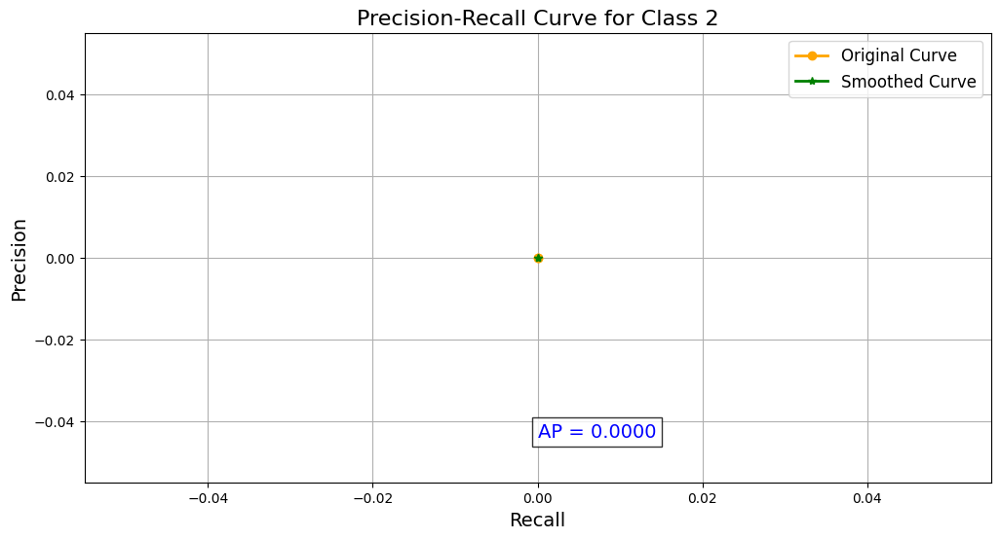

0.3333333432674408

In [62]:
"""
------
TEST 1
------
"""
preds = [
  {
      'labels': torch.tensor([0, 1, 2, 0, 0, 1]),
      'scores': torch.tensor([0.94, 0.83, 0.72, 0.61, 0.55, 0.50]),
      'boxes': torch.tensor([[1, 1, 2, 2], [3, 3, 4, 4], [0, 0, 5, 5], [4, 4, 6, 6], [2, 2, 3, 3], [6, 6, 7, 7]])
  }
]

targets = [
  {
      'labels': torch.tensor([0]),
      'boxes': torch.tensor([[1, 1, 2, 2]])
  }
]

Mean_Average_Precision(preds, targets, threshold=0.5, show=True)

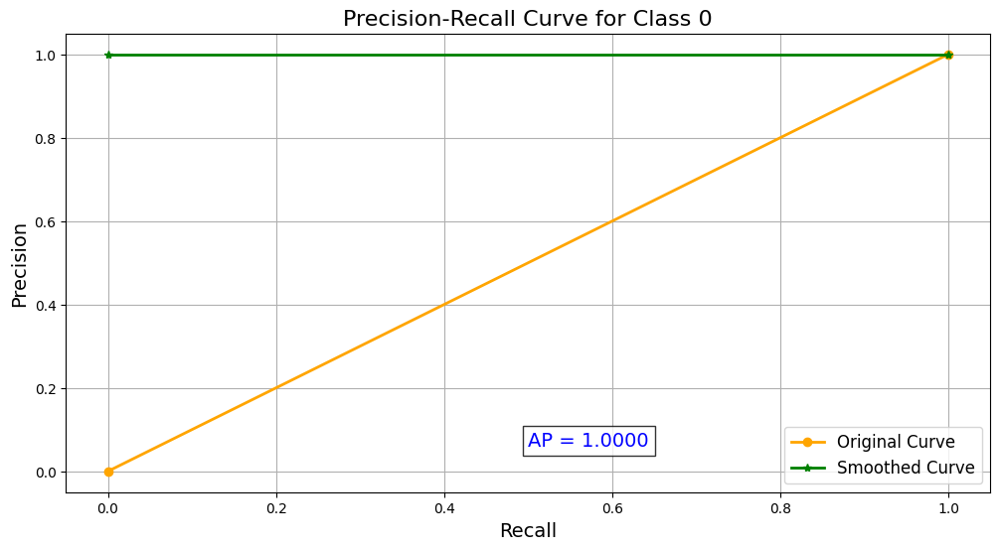

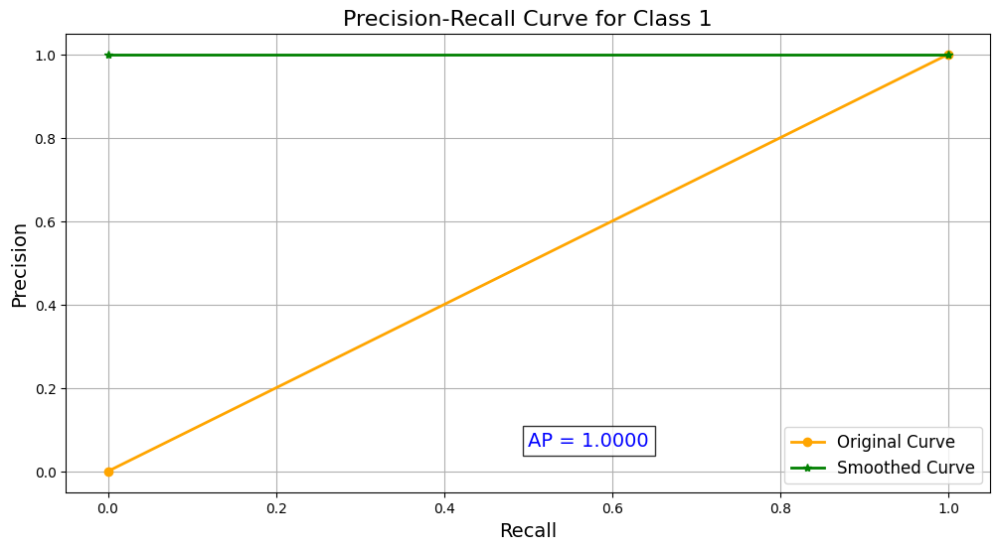

1.0

In [63]:
"""
------
TEST 2
------
"""
preds = [
  {
      'labels': torch.tensor([1, 0]),
      'scores': torch.tensor([0.78, 0.62]),
      'boxes': torch.tensor([[1, 1, 3, 3], [2, 2, 4, 4]])
  }
]

targets = [
  {
      'labels': torch.tensor([1, 0, 0]),
      'boxes': torch.tensor([[1, 1, 3, 3], [2, 2, 4, 4], [3, 3, 5, 5]])
  }
]

Mean_Average_Precision(preds, targets, threshold=0.5, show=True)

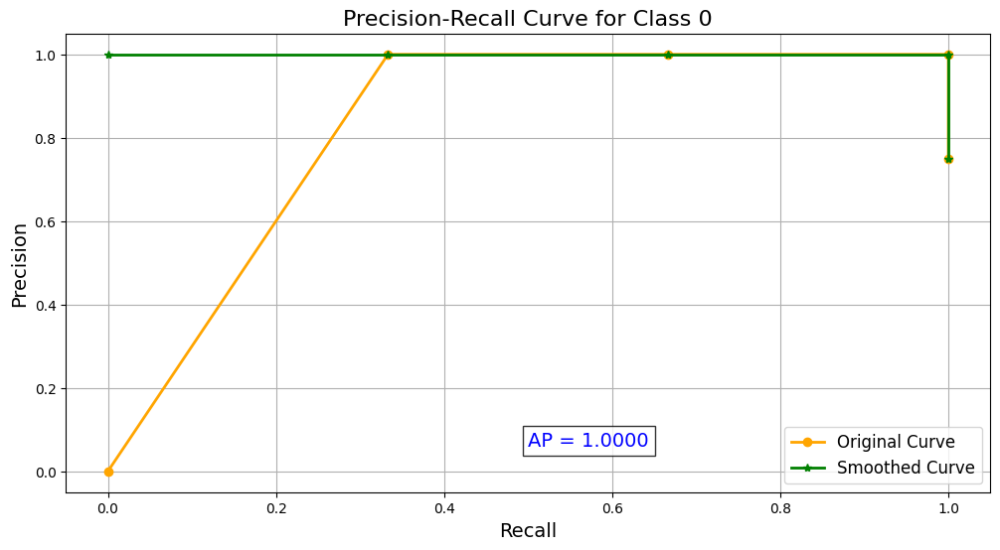

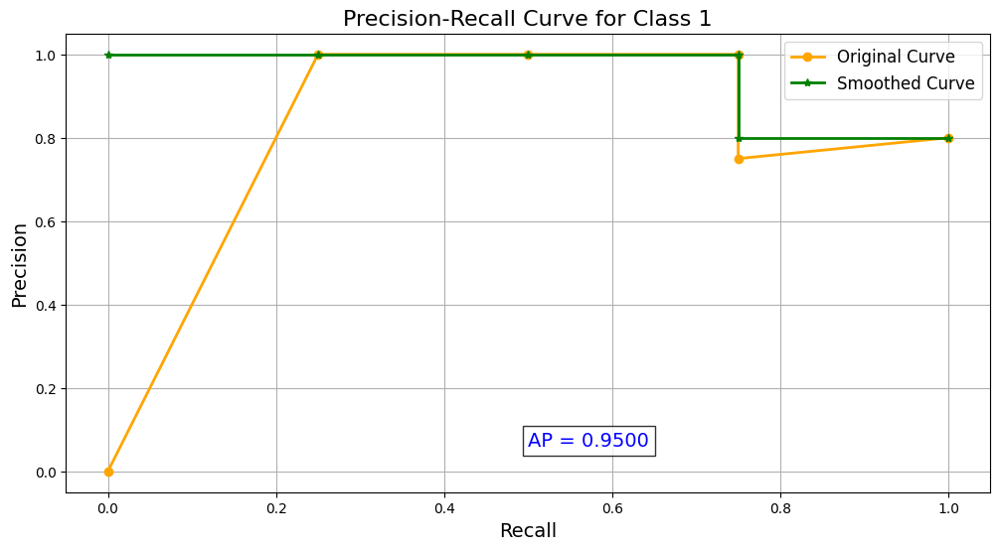

0.9750000238418579

In [64]:
"""
------
TEST 3
------
"""
preds = [
    {
        'labels': torch.tensor([1, 0, 0]),
        'scores': torch.tensor([0.95, 0.85, 0.55]),
        'boxes': torch.tensor([[10, 10, 20, 20], [15, 15, 25, 25], [30, 30, 40, 40]])
    },
    {
        'labels': torch.tensor([0, 1]),
        'scores': torch.tensor([0.99, 0.45]),
        'boxes': torch.tensor([[5, 5, 10, 10], [50, 50, 60, 60]])
    },
    {
        'labels': torch.tensor([1]),
        'scores': torch.tensor([0.9]),
        'boxes': torch.tensor([[25, 25, 35, 35]])
    },
    {
        'labels': torch.tensor([0, 1, 1]),
        'scores': torch.tensor([0.88, 0.7, 0.6]),
        'boxes': torch.tensor([[1, 1, 6, 6], [7, 7, 13, 13], [14, 14, 20, 20]])
    }
]

targets = [
    {
        'labels': torch.tensor([1, 0]),
        'boxes': torch.tensor([[10, 10, 20, 20], [15, 15, 25, 25]])
    },
    {
        'labels': torch.tensor([0, 1]),
        'boxes': torch.tensor([[5, 5, 10, 10], [50, 50, 60, 60]])
    },
    {
        'labels': torch.tensor([1]),
        'boxes': torch.tensor([[25, 25, 35, 35]])
    },
    {
        'labels': torch.tensor([0, 1]),
        'boxes': torch.tensor([[1, 1, 6, 6], [7, 7, 13, 13]])
    }
]

Mean_Average_Precision(preds, targets, threshold=0.5, show=True)

## Разработать модель на основе VGG16

In [65]:
from torchvision.models import VGG16_Weights
from torchvision        import models
from torchview          import draw_graph

import torch
import torch.nn as nn
import torch.nn.init as init

class L2Norm(nn.Module):
    def __init__(self, n_channels, scale):
        super(L2Norm, self).__init__()
        self.n_channels = n_channels
        self.gamma      = scale or None
        self.eps        = 1e-10
        self.weight     = nn.Parameter(torch.Tensor(self.n_channels))
        self.reset_parameters()

    def reset_parameters(self):
        init.constant_(self.weight, self.gamma)

    def forward(self, x):
        norm = torch.sqrt(x.pow(2).sum(dim=1, keepdim=True)) + self.eps
        x = torch.div(x, norm)
        x = self.weight.unsqueeze(0).unsqueeze(2).unsqueeze(3).expand_as(x) * x
        return x

class SSD_VGG16(nn.Module):
    def __init__(self, num_bboxes_s, num_labels = 3):
        super().__init__()

        self.num_bboxes_s = num_bboxes_s
        self.num_labels   = num_labels

        self.used_layer_id_s       = [21, 33, 37, 41, 45, 49]
        self.norm_layer            = L2Norm(512, 20)

        base_layers       = self._build_base_layers ()
        extra_layers      = self._build_extra_layers()
        self.total_layers = base_layers + extra_layers

        self.conf_layers, self.loc_layers = self._build_conf_loc_layers()

    def _build_base_layers(self):
        backbone_model    = models.vgg16(weights=VGG16_Weights.DEFAULT)

        base_layers = nn.ModuleList(list(backbone_model.features)[:-1])

        pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
        conv6 = nn.Conv2d( 512, 1024, kernel_size=3, padding=6, dilation=6)
        relu6 = nn.ReLU(inplace=True)
        conv7 = nn.Conv2d(1024, 1024, kernel_size=1)
        relu7 = nn.ReLU(inplace=True)

        nn.init.xavier_uniform_(conv6.weight)
        nn.init.zeros_         (conv6  .bias)
        nn.init.xavier_uniform_(conv7.weight)
        nn.init.zeros_         (conv7  .bias)

        base_layers.extend( [pool5, conv6, relu6, conv7, relu7] )

        return base_layers

    def _build_extra_layers(self):
        extra_layers = []

        conv8_1  = nn.Conv2d( 1024, 256, kernel_size=1, stride=1          )
        relu8_1  = nn.ReLU(inplace=True)
        conv8_2  = nn.Conv2d( 256, 512, kernel_size=3, stride=2, padding=1)
        relu8_2  = nn.ReLU(inplace=True)
        conv9_1  = nn.Conv2d( 512, 128, kernel_size=1, stride=1           )
        relu9_1  = nn.ReLU(inplace=True)
        conv9_2  = nn.Conv2d( 128, 256, kernel_size=3, stride=2, padding=1)
        relu9_2  = nn.ReLU(inplace=True)
        conv10_1 = nn.Conv2d( 256, 128, kernel_size=1, stride=1           )
        relu10_1 = nn.ReLU(inplace=True)
        conv10_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
        relu10_2 = nn.ReLU(inplace=True)
        conv11_1 = nn.Conv2d( 256, 128, kernel_size=1                     )
        relu11_1 = nn.ReLU(inplace=True)
        conv11_2 = nn.Conv2d( 128, 256, kernel_size=3, stride=1           )
        relu11_2 = nn.ReLU(inplace=True)

        nn.init.xavier_uniform_(conv8_1 .weight)
        nn.init.zeros_         (conv8_1 .bias  )
        nn.init.xavier_uniform_(conv8_2 .weight)
        nn.init.zeros_         (conv8_2 .bias  )
        nn.init.xavier_uniform_(conv9_1 .weight)
        nn.init.zeros_         (conv9_1 .bias  )
        nn.init.xavier_uniform_(conv9_2 .weight)
        nn.init.zeros_         (conv9_2 .bias  )
        nn.init.xavier_uniform_(conv10_1.weight)
        nn.init.zeros_         (conv10_1.bias  )
        nn.init.xavier_uniform_(conv10_2.weight)
        nn.init.zeros_         (conv10_2.bias  )
        nn.init.xavier_uniform_(conv11_1.weight)
        nn.init.zeros_         (conv11_1.bias  )
        nn.init.xavier_uniform_(conv11_2.weight)
        nn.init.zeros_         (conv11_2.bias  )

        extra_layers = nn.ModuleList( [conv8_1, relu8_1, conv8_2, relu8_2, conv9_1, relu9_1, conv9_2, relu9_2, conv10_1, relu10_1, conv10_2, relu10_2, conv11_1, relu11_1, conv11_2, relu11_2] )
        return extra_layers

    def _build_conf_loc_layers(self):
        out_channels_s = [ self.total_layers[i].out_channels for i in self.used_layer_id_s ]

        conf_layers, loc_layers = [], []
        for i, j in enumerate(self.used_layer_id_s):
            conf_layer = nn.Conv2d( self.total_layers[j].out_channels, self.num_bboxes_s[i] * self.num_labels, kernel_size=3, padding=1)
            loc_layer  = nn.Conv2d( self.total_layers[j].out_channels, self.num_bboxes_s[i] * 4              , kernel_size=3, padding=1)

            nn.init.xavier_uniform_(conf_layer.weight)
            nn.init.zeros_         (conf_layer  .bias)
            nn.init.xavier_uniform_(loc_layer .weight)
            nn.init.zeros_         (loc_layer   .bias)

            conf_layers += [conf_layer]
            loc_layers  += [loc_layer ]

        conf_layers = nn.ModuleList(conf_layers)
        loc_layers  = nn.ModuleList(loc_layers )

        return conf_layers, loc_layers

    def forward(self, x, verbose=False):
        source_s, loc_s, conf_s = [], [], []

        for i, current_layer in enumerate(self.total_layers, -1):
            x = current_layer(x)
            if i in self.used_layer_id_s:
                if i == 21:
                    s = self.norm_layer(x)
                else:
                    s = x
                source_s.append(s)
        for s, l, c in zip(source_s, self.loc_layers, self.conf_layers):
            conf_s.append(c(s).permute(0, 2, 3, 1).contiguous())
            loc_s .append(l(s).permute(0, 2, 3, 1).contiguous())
        conf_s = torch.cat([o.view(o.size(0), -1) for o in conf_s], 1)
        loc_s  = torch.cat([o.view(o.size(0), -1) for o in loc_s ], 1)

        conf_s = conf_s.view(conf_s.size(0), -1, self.num_labels)
        loc_s  = loc_s .view(loc_s .size(0), -1, 4              )

        return loc_s, conf_s

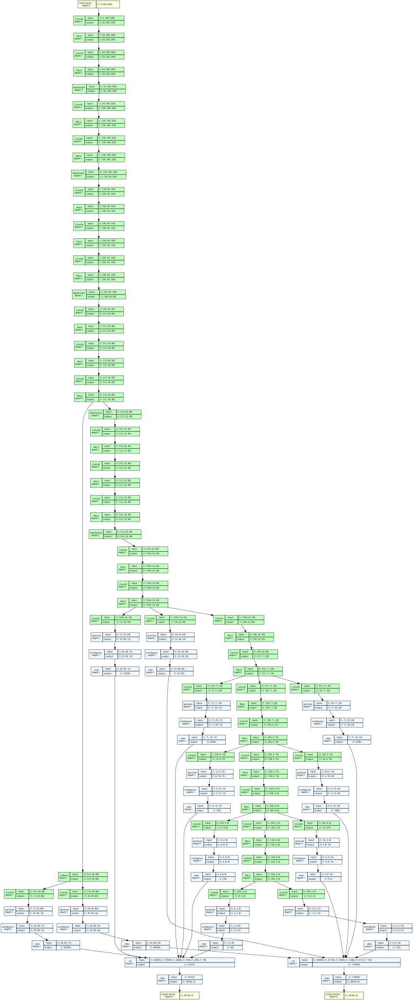

In [66]:
num_bboxes_s = [6,6,6,6,4,4]
model = SSD_VGG16(num_bboxes_s, 2)

model_graph  = draw_graph(model, input_size=(1,3,360,640), expand_nested=True)
visual_graph = model_graph.visual_graph
visual_graph

In [67]:
import torch.nn.functional as F

class MultiBoxLoss(nn.Module):
    """SSD Weighted Loss Function
    Compute Targets:
        1) Produce Confidence Target Indices by matching  ground truth boxes
           with (default) 'priorboxes' that have jaccard index > threshold parameter
           (default threshold: 0.5).
        2) Produce localization target by 'encoding' variance into offsets of ground
           truth boxes and their matched  'priorboxes'.
        3) Hard negative mining to filter the excessive number of negative examples
           that comes with using a large number of default bounding boxes.
           (default negative:positive ratio 3:1)
    Objective Loss:
        L(x,c,l,g) = (Lconf(x, c) + αLloc(x,l,g)) / N
        Where, Lconf is the CrossEntropy Loss and Lloc is the SmoothL1 Loss
        weighted by α which is set to 1 by cross val.
        Args:
            c: class confidences,
            l: predicted boxes,
            g: ground truth boxes
            N: number of matched default boxes
        See: https://arxiv.org/pdf/1512.02325.pdf for more details.
    """

    def __init__(self, overlap_threshold, neg_pos_ratio, variance):
        super(MultiBoxLoss, self).__init__()
        self.threshold     = overlap_threshold
        self.neg_pos_ratio = neg_pos_ratio
        self.variance      = variance

    def forward(self, predictions, targets):
        """Multibox Loss
        Args:
            predictions (tuple): A tuple containing loc preds, conf preds,
            and prior boxes from SSD net.
                conf shape: torch.size(batch_size,num_priors,num_classes)
                loc shape: torch.size(batch_size,num_priors,4)
                priors shape: torch.size(num_priors,4)

            targets (tensor): Ground truth boxes and labels for a batch,
                shape: [batch_size,num_objs,5] (last idx is the label).
        """
        loc_data, conf_data, priors = predictions
        gt_label_s, gt_box_s = targets

        device = loc_data.device

        batch_size  = loc_data .size( 0)
        num_priors  = loc_data .size( 1)
        num_classes = conf_data.size(-1)

        # match priors (default boxes) and ground truth boxes
        loc_t  = torch.zeros(batch_size, num_priors, 4, device=device).float()
        conf_t = torch.zeros(batch_size, num_priors   , device=device).long ()

        neg_pos_ratio = self.neg_pos_ratio
        threshold     = self.threshold
        variance      = self.variance
        #Решаем задачу соответствия между GT боксами и предсказанными боксами
        for idx in range(batch_size):
            loc_t[idx], conf_t[idx] = match(threshold, gt_box_s[idx], priors, variance, gt_label_s[idx])

        pos = conf_t > 0 # Не фон
        num_pos = pos.sum(dim=1, keepdim=True)

        # Вычисляем Localization Loss (Smooth L1)
        # Shape: [batch, num_priors, 4]
        loc_p = loc_data[pos].view(-1, 4)
        loc_t = loc_t   [pos].view(-1, 4)
        loss_l = F.smooth_l1_loss(loc_p, loc_t, reduction='sum')

        # Вычисляем Classification Loss
        loss_c = F.cross_entropy(conf_data.view(-1, num_classes), conf_t.view(-1), reduction='none')
        loss_c = loss_c.view(batch_size, num_priors)

        # Filter out the negative samples and reduce the loss by sum
        loss_c_pos = loss_c[pos].sum()

        # Hard negative mining
        num_neg = torch.clamp(neg_pos_ratio * num_pos, max=pos.size(1) - 1)
        loss_c_neg = loss_c * ~pos
        loss_c_neg, _ = loss_c_neg.sort(1, descending=True)
        neg_mask = torch.zeros_like(loss_c_neg)
        neg_mask[torch.arange(batch_size), num_neg.view(-1)] = 1.
        neg_mask = 1 - neg_mask.cumsum(-1)
        loss_c_neg = (loss_c_neg * neg_mask).sum()

        # Finally we normalize the losses by the number of positives
        N = num_pos.sum()
        loss_l = loss_l / N
        loss_c = (loss_c_pos + loss_c_neg) / N

        return loss_l, loss_c

In [85]:
from torch.optim.lr_scheduler import MultiStepLR

from tqdm        import tqdm

import time
import os

def train_process(model, args, custom_config):
    torch.manual_seed(     args.seed)
    np.random.seed   (seed=args.seed)

    dataset_root_dir          = args.dataset_root_dir
    train_annotation_filename = os.path.join( dataset_root_dir, "ImageSets/Main/trainval.txt" )
    test_annotation_filename  = os.path.join( dataset_root_dir, "ImageSets/Main/test.txt"     )
    train_dataloader          = get_train_dataloader(dataset_root_dir, train_annotation_filename, args.batch_size, args.num_workers)
    test_dataloader           = get_test_dataloader (dataset_root_dir, test_annotation_filename , args.batch_size, args.num_workers)

    learning_rate = args.learning_rate

    DEVICE = args.device

    if not os.path.exists(args.output):
        os.mkdir(args.output)

    prior_box_s = prior_boxes(custom_config)
    prior_box_s_gpu = prior_box_s.to(DEVICE)

    overlap_threshold = custom_config['overlap_threshold']
    neg_pos_ratio     = custom_config['neg_pos_ratio'    ]
    variance          = custom_config['variance']

    criterion = MultiBoxLoss( overlap_threshold, neg_pos_ratio, variance)
    model    .to(DEVICE)
    criterion.to(DEVICE)

    optimizer = torch.optim.SGD(model.parameters(), lr=args.learning_rate, momentum=args.momentum, weight_decay=args.weight_decay )
    scheduler = MultiStepLR(optimizer=optimizer, milestones=args.multistep, gamma=0.2)

    best_loc_loss, best_cls_loss, best_loss = np.inf, np.inf, np.inf
    train_loss_s, eval_loss_s = [], []
    for epoch in tqdm(list(range(args.epochs))):
        #Train model
        train_loc_loss, train_cls_loss, train_loss = 0, 0, 0
        model.train()
        for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(train_dataloader):
            if len(box_ss_cpu) > 0 and len(label_ss_cpu) > 0:
                image_s_gpu  =   image_s_cpu.to(DEVICE)
                label_ss_gpu = [ label_s_cpu.to(DEVICE) for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .to(DEVICE) for box_s_cpu   in box_ss_cpu   ]

                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)

                loc_loss, cls_loss = criterion( (pred_loc_ss_gpu, pred_conf_ss_gpu, prior_box_s_gpu), (label_ss_gpu, box_ss_gpu))

                loss = loc_loss + cls_loss

                optimizer.zero_grad()
                loss     .backward ()
                optimizer.step     ()

                train_loc_loss += loc_loss.item()
                train_cls_loss += cls_loss.item()
                train_loss     += loss    .item()
        scheduler.step()
        train_loss_s.append(train_loss)
        #Eval model
        eval_loc_loss, eval_cls_loss, eval_loss = 0, 0, 0
        model.eval()
        for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(test_dataloader):
            if len(box_ss_cpu) > 0 and len(label_ss_cpu) > 0:
                image_s_gpu  = image_s_cpu  .to(DEVICE)
                label_ss_gpu = [ label_s_cpu.to(DEVICE) for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .to(DEVICE) for box_s_cpu   in box_ss_cpu   ]

                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)

                loc_loss, cls_loss = criterion( (pred_loc_ss_gpu, pred_conf_ss_gpu, prior_box_s_gpu), (label_ss_gpu, box_ss_gpu))
                loss = loc_loss + cls_loss

                eval_loc_loss += loc_loss.item()
                eval_cls_loss += cls_loss.item()
                eval_loss     += loss    .item()
        eval_loss_s.append(eval_loss)
        #Calculate metrics
        pred_box_ss, pred_score_ss, pred_label_ss = list(), list(), list()
        preds, targets = list(), list()
        model.eval()
        with torch.no_grad():
            for i , (image_s_cpu, box_ss_cpu, label_ss_cpu) in enumerate(test_dataloader):
                image_s_gpu  = image_s_cpu  .to(DEVICE)
                label_ss_gpu = [ label_s_cpu.to(DEVICE) for label_s_cpu in label_ss_cpu ]
                box_ss_gpu   = [ box_s_cpu  .to(DEVICE) for box_s_cpu   in box_ss_cpu   ]

                pred_loc_ss_gpu, pred_conf_ss_gpu = model(image_s_gpu)
                pred_conf_ss_cpu = F.softmax(pred_conf_ss_gpu, dim=2).cpu()
                pred_loc_ss_cpu  = pred_loc_ss_gpu                   .cpu()

                pred_box_ss, pred_label_ss, pred_conf_ss = detect_objects(pred_loc_ss_cpu, pred_conf_ss_cpu, prior_box_s, 2, 0.5, 0.2)

                for pred_box_s, pred_label_s, pred_score_s in zip(pred_box_ss, pred_label_ss, pred_conf_ss):
                    preds.append({
                        "boxes": pred_box_s,
                        "scores": pred_score_s,
                        "labels": pred_label_s
                    })

                for gt_box_s, gt_label_s in zip(box_ss_cpu, label_ss_cpu):
                    targets.append({
                        "boxes": gt_box_s,
                        "labels": gt_label_s
                    })

            mAP = Mean_Average_Precision(preds, targets, threshold=overlap_threshold)

        print(' epoch[{}] | lr {:.5f} | loc_loss [{:.2f}/{:.2f}] | cls_loss [{:.2f}/{:.2f}] | total_loss [{:.2f}/{:.2f}] | mAP {:.5f}'.format(epoch, scheduler.get_last_lr()[0], train_loc_loss, eval_loc_loss, train_cls_loss, eval_cls_loss, train_loss, eval_loss, mAP))
        if eval_loss < best_loss :
            torch.save(model.state_dict(), os.path.join(args.output, f"{custom_config['model_name']}.pth"))
            best_loc_loss, best_cls_loss, best_loss = eval_loc_loss, eval_cls_loss, eval_loss
    return model, prior_box_s, train_loss_s, eval_loss_s

In [73]:
from argparse import Namespace


device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print(device)

param_s = Namespace(
    dataset_root_dir='dataset',
    epochs = 10, batch_size = 8,
    checkpoint = None, output = 'output',
    multistep = [20, 30, 40],
    learning_rate = 1e-3, momentum = 0.9,
    weight_decay = 0.0005, warmup = None,
    num_workers = os.cpu_count(),
    seed = 42, device = device
)

cuda:0


## Создаем конфигурацию, которая описывает работы нашего детектора (пример для VGG16)

In [87]:
#VGG16

custom_config_vgg = {
 'num_classes'  : 2,
 'feature_maps' : [(45,80), (22,40), (11,20), (6,10), (4,8), (2,6)], #VGG16 - 640x360, размерность карт признаков, которые будут использоваться
 'min_sizes'    : [0.10, 0.20, 0.37, 0.54, 0.71, 1.00], #Параметр масштаба боксов
 'max_sizes'    : [0.20, 0.37, 0.54, 0.71, 1.00, 1.05], #Параметр масштаба боксов

 'aspect_ratios': [[2, 3], [2, 3], [2, 3], [2, 3], [2], [2]], #Список содержаший информацию о соотношении сторон для prior боксов
 'num_priors'   : [6, 6, 6, 6, 4, 4], #Число prior боксов
 'variance'     : [0.1, 0.2],
 'clip'         :    True,

 'overlap_threshold': 0.5, #Параметр IoU
 'neg_pos_ratio'    :   3, #Параметр hard-negative mining

 'model_name' : 'vgg16'
}

model_vgg16 = SSD_VGG16(custom_config_vgg['num_priors'], custom_config_vgg['num_classes'])

## Натренировать модель на основе VGG16

In [88]:
model_vgg16, prior_box_s, train_loss_s, eval_loss_s = train_process(model_vgg16, param_s, custom_config_vgg)

 10%|█         | 1/10 [02:36<23:30, 156.77s/it]

 epoch[0] | lr 0.00100 | loc_loss [246.48/5.53] | cls_loss [485.84/11.74] | total_loss [732.31/17.27] | mAP 0.96431
 epoch[1] | lr 0.00100 | loc_loss [111.37/4.44] | cls_loss [240.56/9.96] | total_loss [351.93/14.40] | mAP 0.98130


 20%|██        | 2/10 [05:13<20:55, 156.99s/it]

 epoch[2] | lr 0.00100 | loc_loss [84.26/3.34] | cls_loss [210.66/9.67] | total_loss [294.92/13.01] | mAP 0.97597


 30%|███       | 3/10 [07:50<18:18, 156.97s/it]

 epoch[3] | lr 0.00100 | loc_loss [72.74/3.00] | cls_loss [191.59/8.79] | total_loss [264.33/11.79] | mAP 0.97938


 40%|████      | 4/10 [10:27<15:40, 156.68s/it]

 epoch[4] | lr 0.00100 | loc_loss [64.06/2.83] | cls_loss [177.96/8.37] | total_loss [242.03/11.21] | mAP 0.97991


 50%|█████     | 5/10 [13:04<13:03, 156.77s/it]

 epoch[5] | lr 0.00100 | loc_loss [59.49/2.75] | cls_loss [170.10/8.28] | total_loss [229.58/11.03] | mAP 0.98705


 70%|███████   | 7/10 [18:17<07:50, 156.75s/it]

 epoch[6] | lr 0.00100 | loc_loss [54.51/2.84] | cls_loss [160.70/8.22] | total_loss [215.21/11.07] | mAP 0.98211
 epoch[7] | lr 0.00100 | loc_loss [50.54/2.55] | cls_loss [152.24/7.89] | total_loss [202.78/10.44] | mAP 0.98249


 80%|████████  | 8/10 [20:53<05:13, 156.64s/it]

 epoch[8] | lr 0.00100 | loc_loss [46.58/2.48] | cls_loss [145.01/7.78] | total_loss [191.59/10.26] | mAP 0.98372


100%|██████████| 10/10 [26:07<00:00, 156.74s/it]

 epoch[9] | lr 0.00100 | loc_loss [44.42/2.62] | cls_loss [137.92/8.10] | total_loss [182.33/10.72] | mAP 0.98155


In [77]:
import gc
gc.collect()
torch.cuda.empty_cache()

## Разработать модель на основе ResNet18

In [78]:
import torchvision.models as models
from torchvision.models import ResNet18_Weights

import torch
import torch.nn as nn
import torch.nn.init as init

class BasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super(BasicBlock, self).__init__()
        self.down = downsample

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        if downsample:
            conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, bias=False)
            bn3 = nn.BatchNorm2d(out_channels)
            init.xavier_uniform_(conv3.weight)
            self.downsample = nn.Sequential(
                conv3,
                bn3
            )

        init.xavier_uniform_(self.conv1.weight)
        init.xavier_uniform_(self.conv2.weight)

    def forward(self, x):
        identity = self.downsample(x) if self.down else x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out += identity
        out = self.relu(out)

        return out


class ExtraBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ExtraBlock, self).__init__()

        layer1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        layer2 = nn.ReLU(inplace=True)
        layer3 = nn.Conv2d(out_channels, in_channels, kernel_size=3, stride=2, padding=1, bias=False)
        layer4 = nn.ReLU(inplace=True)

        init.xavier_uniform_(layer1.weight)
        init.xavier_uniform_(layer3.weight)

        self.block = nn.Sequential(
            layer1,
            layer2,
            layer3,
            layer4
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.block(x)


class SSD_ResNet18(nn.Module):
    def __init__(self, num_bboxes_s, num_labels = 3):
        super().__init__()

        self.num_bboxes_s = num_bboxes_s
        self.num_labels   = num_labels

        self.used_layer_id_s  = [5, 8, 9, 10, 11, 12]

        base_layers       = self._build_base_layers ()
        extra_layers      = self._build_extra_layers()
        self.total_layers = base_layers + extra_layers

        self.conf_layers, self.loc_layers = self._build_conf_loc_layers()

    def _build_base_layers(self):
        backbone_model = models.resnet18(weights=ResNet18_Weights.DEFAULT)

        base_layers = nn.ModuleList(list(backbone_model.children())[:-3])

        additional_layer = nn.Sequential(
            BasicBlock(256,128,True),
            BasicBlock(128,128,False)
        )

        return base_layers + additional_layer

    def _build_extra_layers(self):
        extra_layers = []

        for _ in range(4):
            extra_layers.append(ExtraBlock(128,64))

        extra_layers = nn.ModuleList( extra_layers )
        return extra_layers

    def _build_conf_loc_layers(self):
        out_channels_s = []
        dummy_input = torch.randn(1, 3, 360, 640)

        x = dummy_input
        for i, layer in enumerate(self.total_layers):
            x = layer(x)
            if i in self.used_layer_id_s:
                out_channels_s.append(x.size(1))

        conf_layers, loc_layers = [], []
        for i, j in enumerate(self.used_layer_id_s):
            conf_layer = nn.Conv2d( out_channels_s[i], self.num_bboxes_s[i] * self.num_labels, kernel_size=3, padding=1)
            loc_layer  = nn.Conv2d( out_channels_s[i], self.num_bboxes_s[i] * 4              , kernel_size=3, padding=1)

            nn.init.xavier_uniform_(conf_layer.weight)
            nn.init.zeros_         (conf_layer  .bias)
            nn.init.xavier_uniform_(loc_layer .weight)
            nn.init.zeros_         (loc_layer   .bias)

            conf_layers += [conf_layer]
            loc_layers  += [loc_layer ]

        conf_layers = nn.ModuleList(conf_layers)
        loc_layers  = nn.ModuleList(loc_layers )

        return conf_layers, loc_layers

    def forward(self, x, verbose=False):
        source_s, loc_s, conf_s = [], [], []

        for i, current_layer in enumerate(self.total_layers):
            x = current_layer(x)
            if i in self.used_layer_id_s:
                source_s.append(x)
        for s, l, c in zip(source_s, self.loc_layers, self.conf_layers):
            conf_s.append(c(s).permute(0, 2, 3, 1).contiguous())
            loc_s .append(l(s).permute(0, 2, 3, 1).contiguous())
        conf_s = torch.cat([o.view(o.size(0), -1) for o in conf_s], 1)
        loc_s  = torch.cat([o.view(o.size(0), -1) for o in loc_s ], 1)

        conf_s = conf_s.view(conf_s.size(0), -1, self.num_labels)
        loc_s  = loc_s .view(loc_s .size(0), -1, 4              )

        return loc_s, conf_s

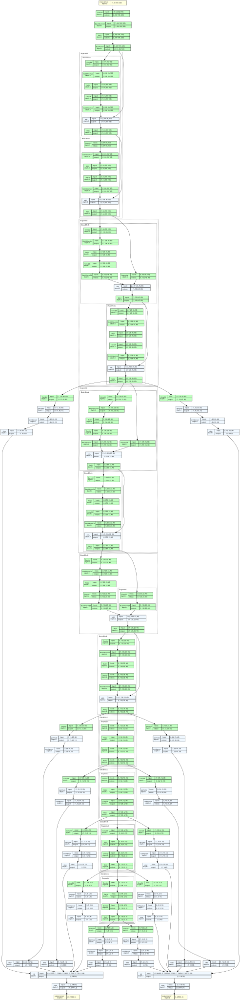

In [79]:
from torchview          import draw_graph
num_bboxes_s = [6, 6, 6, 6, 4, 4]

model = SSD_ResNet18(num_bboxes_s, 2)
model_graph  = draw_graph(model, input_size=(1,3,360,640), expand_nested=True)
visual_graph = model_graph.visual_graph
visual_graph

## Натренировать модель на основе ResNet18

In [81]:
#ResNet18
custom_config_resnet = {
 'num_classes'  : 2,
 'feature_maps' : [(45,80), (23,40), (12,20), (6,10), (3,5), (2,3)],
 'min_sizes'    : [0.10, 0.20, 0.37, 0.54, 0.71, 1.00], #Параметр масштаба боксов
 'max_sizes'    : [0.20, 0.37, 0.54, 0.71, 1.00, 1.05], #Параметр масштаба боксов

 'aspect_ratios': [[2, 3], [2, 3], [2, 3], [2, 3], [2], [2]], #Список содержаший информацию о соотношении сторон для prior боксов
 'num_priors'   : [6, 6, 6, 6, 4, 4], #Число prior боксов
 'variance'     : [0.1, 0.2],
 'clip'         :    True,

 'overlap_threshold': 0.5, #Параметр IoU
 'neg_pos_ratio'    :   3, #Параметр hard-negative mining

 'model_name' : 'resnet18'
}

model_resnet18 = SSD_ResNet18(custom_config_resnet['num_priors'], custom_config_resnet['num_classes'])

In [86]:
model_resnet18, prior_box_s, train_loss_s, eval_loss_s = train_process(model_resnet18, param_s, custom_config_resnet)

 10%|█         | 1/10 [00:29<04:22, 29.17s/it]

 epoch[0] | lr 0.00100 | loc_loss [134.42/5.49] | cls_loss [260.05/11.26] | total_loss [394.47/16.74] | mAP 0.96328


 20%|██        | 2/10 [00:58<03:53, 29.16s/it]

 epoch[1] | lr 0.00100 | loc_loss [114.10/4.95] | cls_loss [236.15/10.56] | total_loss [350.25/15.51] | mAP 0.96914


 30%|███       | 3/10 [01:27<03:23, 29.09s/it]

 epoch[2] | lr 0.00100 | loc_loss [100.50/4.22] | cls_loss [217.74/9.87] | total_loss [318.25/14.08] | mAP 0.97411


 40%|████      | 4/10 [01:56<02:54, 29.09s/it]

 epoch[3] | lr 0.00100 | loc_loss [90.39/3.93] | cls_loss [202.98/9.50] | total_loss [293.36/13.43] | mAP 0.96889


 50%|█████     | 5/10 [02:26<02:27, 29.51s/it]

 epoch[4] | lr 0.00100 | loc_loss [81.85/3.65] | cls_loss [191.43/9.21] | total_loss [273.28/12.86] | mAP 0.97372


 60%|██████    | 6/10 [02:55<01:57, 29.26s/it]

 epoch[5] | lr 0.00100 | loc_loss [76.38/3.40] | cls_loss [182.14/8.93] | total_loss [258.52/12.33] | mAP 0.97984


 70%|███████   | 7/10 [03:24<01:27, 29.22s/it]

 epoch[6] | lr 0.00100 | loc_loss [71.12/3.28] | cls_loss [173.83/8.89] | total_loss [244.95/12.17] | mAP 0.97291


 80%|████████  | 8/10 [03:54<00:58, 29.47s/it]

 epoch[7] | lr 0.00100 | loc_loss [66.47/3.23] | cls_loss [165.59/8.80] | total_loss [232.05/12.03] | mAP 0.98038


 90%|█████████ | 9/10 [04:23<00:29, 29.30s/it]

 epoch[8] | lr 0.00100 | loc_loss [62.51/3.15] | cls_loss [157.89/8.83] | total_loss [220.41/11.98] | mAP 0.97755


100%|██████████| 10/10 [04:52<00:00, 29.25s/it]

 epoch[9] | lr 0.00100 | loc_loss [59.42/3.02] | cls_loss [151.62/8.76] | total_loss [211.04/11.78] | mAP 0.97739


## (БОНУС) Добавить разнообразные аугментации изображений в классе Dataset. Провести эксперименты и продемонстрировать метрику mAP.